# Исследование заведений общественного питания Москвы

**Заказчик**: Инвесторы из фонда «Shut Up and Take My Money»

**Цель исследования**: подготовить анализ рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Входные данные**: датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Файл `moscow_places.csv`:

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
1. Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
2. Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
3. Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
1. Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
2. Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
3. Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым
- `istrict` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

**Ход исследования**:

Наше исследование будет проходить в пять этапов, а именно:

1. Загрузка и обзор данных;
2. Предобработка данных (поиск пропусков, дублей, проверка типа данных и тд.);
3. Исследовательский анализ данных;
4. Детализация исследования : открытие кофейни;
5. Подготовка презентации; общие выводы и рекомендации.

## Загрузка и обзор данных

In [1]:
# Импортируем необходимые библиотеки

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import warnings; warnings.filterwarnings(action='ignore')
import folium
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Map, Choropleth

In [2]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

In [3]:
# Читаем файл и сохраняем в переменную

try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [4]:
# Выведем общую информацию о датасете

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
# Ознакомимся с полученными данными

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Всего в датасете содержится информация по **8406** точкам общественного питания. Столбец `chain`, обозначающий принадлежность заведения к сети должен иметь булев тип данных, т.к. мы имеем бинарные значения в этом столбце. Можем преступать к предобработке данных.

## Предобработка данных

In [6]:
# Заменим тип данных в столбце chain на булев

data['chain'] = data['chain'].astype('bool')

Теперь проверим датасет на дубликаты и пропуски.

In [7]:
# Проверка датасета на пропуски

data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [8]:
# Посмотрим на долю пропусков в кажом столбце

pd.DataFrame(round(data.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


Больше всего значений пропущенно в столбцах с `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`. Мы не стали заполнять пропуски медианными значениями, т.к. это может сильно исказить результаты исследования.

In [9]:
# Проверка на явные дубли

data.duplicated().sum()

0

Теперь проверим наш датасет на неявные дубли

In [10]:
# Длина списка названий ДО обработки неявных дублей

len(data['name'].unique())

5614

In [11]:
# Приводим все названия к нижнему регистру

data['name'] = data['name'].str.lower()

data['address'] = data['address'].str.lower()

In [12]:
# Длина списка названий ПОСЛЕ обработки неявных дублей
# Благополучно удалено 102 дубля

len(data['name'].unique())

5512

In [65]:
#Код ревьюера
data[['name', 'address']].duplicated().sum()

4

In [13]:
# Создаем столбец с названиями улиц

data['street'] = data['address'].apply(lambda x: x.split(sep=', ')[1])

In [14]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,правобережная улица


In [15]:
# Создадим столбец is_24/7 с обозначением как работает заведение - круглосуточно или нет

data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [16]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,правобережная улица,False


**Промежуточные выводы**

Мы провели обзор и предобработку данных, а именно:

- Загрузили данные и ознакомились с общей информацией;
- Проверили датасет на явные и неявные дубли (последние были удалены);
- Проверили данные на наличие пропусков;
- Создали отдельные столбцы `street` и `is_24/7`.

## Исследовательский анализ данных

### Категории заведений

In [17]:
# Посмотрим, сколько категорий заведений представлено в нашем датасете

data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Всего имеем **8** категорий заведений 

In [18]:
# Группируем данные по категориям для создания графиков

place_category = (data
                .groupby('category')
                .agg(count=('name','count'))
                .reset_index()
                .sort_values('count', ascending=False)
)

place_category['percent'] = (place_category['count'] / sum(place_category['count']) * 100).round(2)

place_category

,category,count,percent
3,кафе,2378,28.29
6,ресторан,2043,24.30
4,кофейня,1413,16.81
0,"бар,паб",765,9.10
5,пиццерия,633,7.53
2,быстрое питание,603,7.17
7,столовая,315,3.75
1,булочная,256,3.05


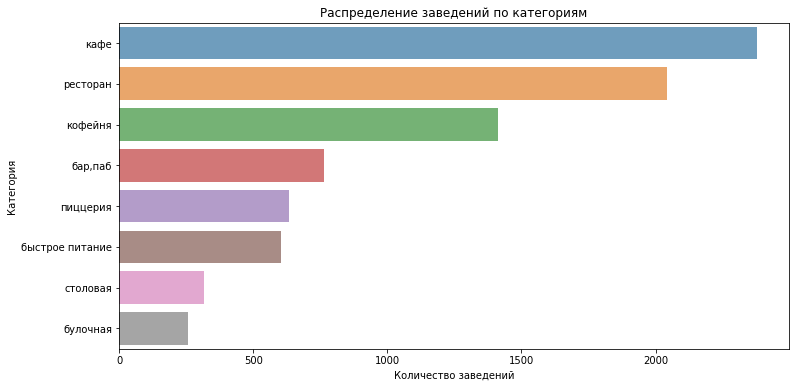

In [19]:
# Строим график распределения заведений по категориям

plt.figure(figsize=(12, 6))

ax = sns.barplot(x='count', y='category', data=place_category, alpha=0.7)

ax.set_title('Распределение заведений по категориям')
ax.set_xlabel('Количество заведений') 
ax.set_ylabel('Категория')
plt.show()

Как мы можем видеть, большинство заведений в Москве относятся к категории кафе ( **2378** объектов, что составлет почти **30%** от общего числа ), далее идут рестораны и кофейни ( **24.3%** и **16.8%** соответственно ).

### Количество посадочных мест

In [20]:
# Группируем данные по категориям и считаем медианные значения количества мест в каждой категории

seats = (data
                .groupby('category')
                .agg(count=('seats','median'))
                .reset_index()
                .sort_values('count', ascending=False)
)

seats['percent'] = (seats['count'] / sum(seats['count']) * 100).round(2)

seats.sort_values(by='count', ascending=False)

,category,count,percent
6,ресторан,86.0,15.52
0,"бар,паб",82.5,14.89
4,кофейня,80.0,14.44
7,столовая,75.5,13.63
2,быстрое питание,65.0,11.73
3,кафе,60.0,10.83
5,пиццерия,55.0,9.93
1,булочная,50.0,9.03


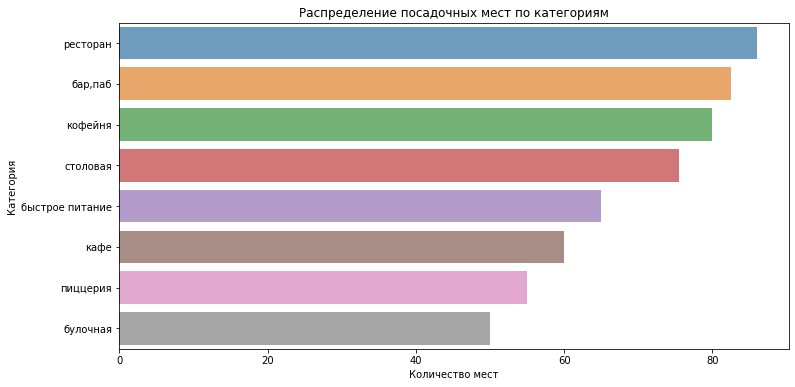

In [21]:
# Строим график распределения посадочных мест по категориям

plt.figure(figsize=(12, 6))

ax = sns.barplot(x='count', y='category', data=seats, alpha=0.7)

ax.set_title('Распределение посадочных мест по категориям')
ax.set_xlabel('Количество мест') 
ax.set_ylabel('Категория')
plt.show()

Для первых четырех категорий медианное количество посадочных мест распределяется с небольшой разницей ( в интервале от **86** до **75** мест ). Меньше всего посадочных мест в булочных и пиццериях ( **50** и **55** мест соответственно ). Думаю, это может быть связано с тем, что такую еду в основном берут навынос, с собой, поэтому нет нужды иметь много посадочных мест.

### Соотношение сетевых и несетевых заведений

In [22]:
chain_or_not = data.groupby('chain').agg(count=('address','count')).reset_index()
chain_or_not

,chain,count
0,False,5201
1,True,3205


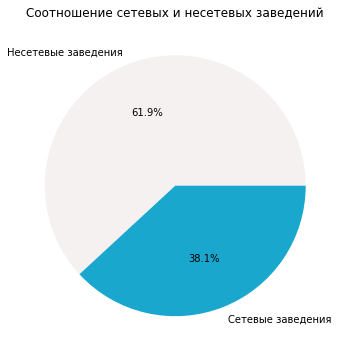

In [23]:
# Строим график соотношения сетевых и несетевых заведений

plt.figure(figsize=(6, 6))

colors=['#F6F1F1', '#19A7CE']

plt.pie(chain_or_not['count'], labels=chain_or_not['chain'].\
        map({True: 'Сетевые заведения', False: 'Несетевые заведения'}),
        colors=colors, 
        autopct='%1.1f%%')

plt.title('Соотношение сетевых и несетевых заведений')
plt.show()

Исходя из диаграммы выше, можем сказать, что более **60%** заведений не являются сетевыми. Доля сетевых объектов **38.1%**

### Категории сетевых заведений

In [24]:
# Группируем данные для построения графика распределения сетевых заведений по категориям

# Формируем сводную таблицу

chain_category = data.query('chain == 1').pivot_table(index='category', values='name', aggfunc='count').\
                         sort_values(by='name', ascending=False).reset_index()

chain_category.rename(columns = {'name':'count'}, inplace = True )

# Считсем долю сетевых заведений от общего количества

chain_category['percent'] = ((chain_category['count'] / data['address'].count()) * 100).round(2)

In [25]:
chain_category

,category,count,percent
0,кафе,779,9.27
1,ресторан,730,8.68
2,кофейня,720,8.57
3,пиццерия,330,3.93
4,быстрое питание,232,2.76
5,"бар,паб",169,2.01
6,булочная,157,1.87
7,столовая,88,1.05


Мы видим, что доли сетевых кафе, ресторанов и кофеен от общего количества заведений равны **9.27%**, **8.68%**, **8.57%** соответственно.

In [26]:
# Строим столбчатую диаграмму 

fig = px.bar(chain_category, 
             x='category', 
             y='count')

fig.update_layout(title='Распределение количества сетевых заведений по категориям',
                   xaxis_title='Категория заведения',
                   yaxis_title='Количество объектов')

fig.show();

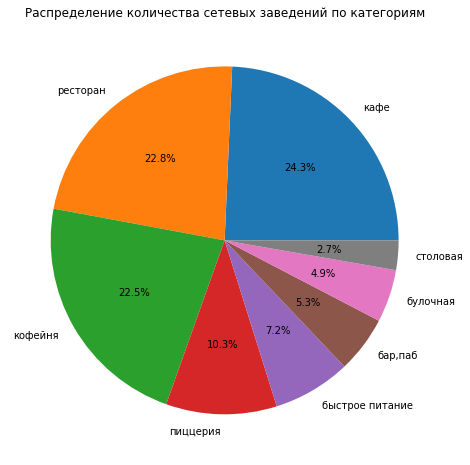

In [27]:
# Строим круговую диаграмму для отображения долей категорий заведений

plt.figure(figsize=(8, 8))

plt.pie(chain_category['count'], 
        labels=chain_category['category'],
        autopct='%1.1f%%')

plt.title('Распределение количества сетевых заведений по категориям')
plt.show()

Большую часть сетевых заведений составляют кафе ( **24.3%** ), рестораны ( **22.8%** ) и кофейни ( **22.5%** ). Меньше всего к сетям относятся столовые и булочные.

### ТОП-15 сетевых заведений в Москве

In [28]:
# Группируем данные по названию сетевых заведений для построения графика

chain_name = (data.query('chain == 1')
                .groupby('name')
                .agg(count=('address','count'))
                .reset_index()
                .sort_values('count', ascending=False)).head(15)

chain_name['category'] = data['category']

# Добавляем столбце с долей заведения от общего количества ТОП-а

chain_name['percent'] = (chain_name['count'] / sum(chain_name['count']) * 100).round(2)

,name,count,category,percent
729,шоколадница,120,ресторан,14.71
335,домино'с пицца,76,ресторан,9.31
331,додо пицца,74,ресторан,9.07
146,one price coffee,71,булочная,8.70
742,яндекс лавка,69,кафе,8.46
58,cofix,65,кофейня,7.97
168,prime,50,кафе,6.13
664,хинкальная,44,кафе,5.39
409,кофепорт,42,"бар,паб",5.15
418,кулинарная лавка братьев караваевых,39,"бар,паб",4.78


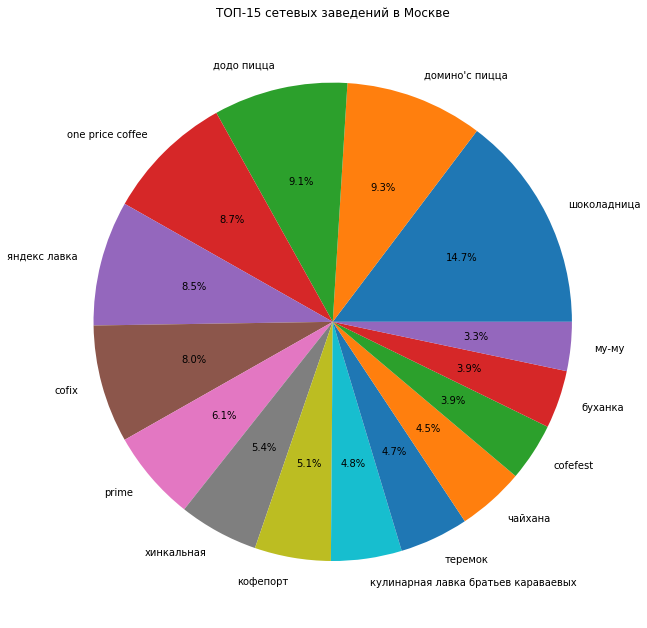

In [29]:
# Строим круговую диаграмму для отображения долей категорий заведений

display(chain_name)

plt.figure(figsize=(11, 11))

plt.pie(chain_name['count'], 
        labels=chain_name['name'],
        autopct='%1.1f%%')

plt.title('ТОП-15 сетевых заведений в Москве')
plt.show()

In [30]:
# Отобразим распределение на дополнительном графике

fig = px.bar(chain_name, x="count", y="name", color='category', orientation='h',
             width=1000, height=500, hover_data=["percent"], text="percent", 
             title='Распределение количества сетевых заведений по категориям и их доля').\
             update_yaxes(categoryorder='total ascending') 
fig.show();

Построив нужные графики, можно сделать ряд выводов:

- В нашем топе лидируют три заведения: "Шоколадница", "Домино'с пицца" и "Додо пицца";
- Все они относятся к категории ресторан;

### Распределение заведений по административным районам Москвы

In [31]:
# Для начала посмотрим какие административные районы Москвы присутствуют в нашем датасете

data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Всего представлено **9** районов

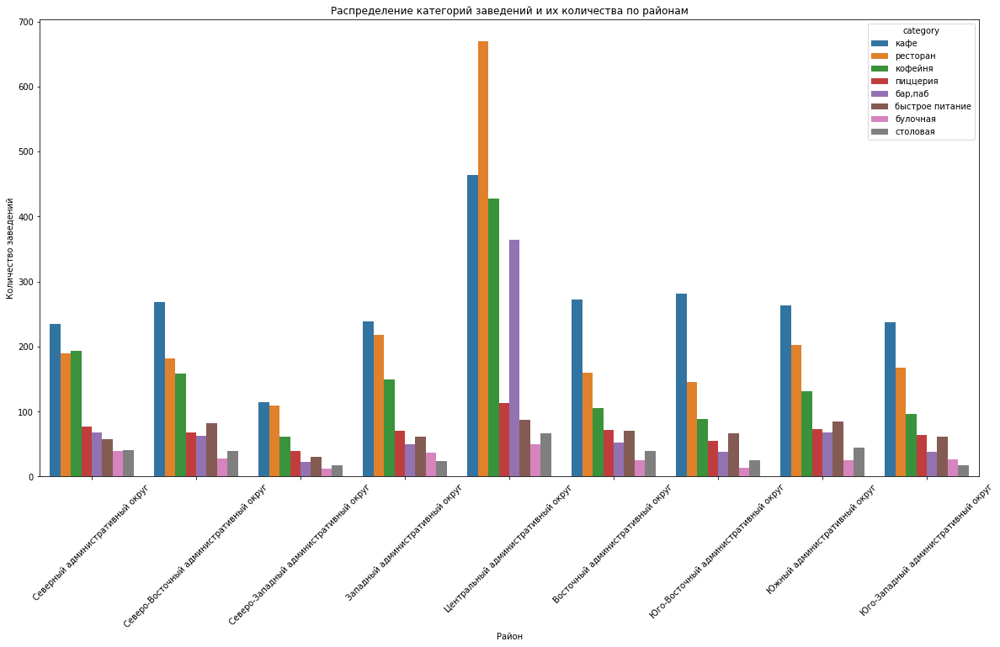

In [32]:
# Попробуем отобразить на одном графике количество заведений и их категории в разрезе административных районов

plt.figure(figsize=(20, 10))

sns.countplot(x='district', hue='category', data=data)
plt.xticks(rotation=45)
plt.title('Распределение категорий заведений и их количества по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.show()

Всего в датасете представлено **9** административных районов Москвы. Самое большое количество различных заведений находится в Центральном административном округе. Основные категории заведений в ЦАО: рестораны, кафе, кофейни и бары. Распределение заведений по остальным АО примерно одинаковое.

### Визуализация распределения средних рейтингов по категорям заведений

In [33]:
data.pivot_table(index='category', values='rating', aggfunc='mean').reset_index().round(2)

,category,rating
0,"бар,паб",4.39
1,булочная,4.27
2,быстрое питание,4.05
3,кафе,4.12
4,кофейня,4.28
5,пиццерия,4.30
6,ресторан,4.29
7,столовая,4.21


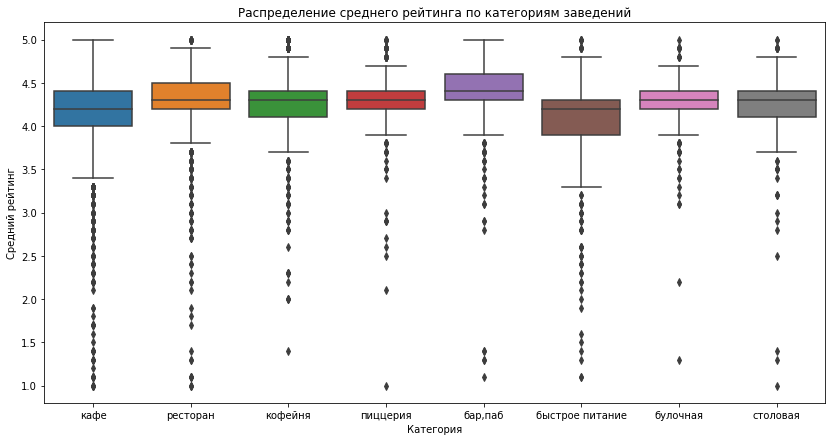

In [34]:
# Воспользуемся методом boxplot для отображения распределения средних рейтингов заведений по категориям 

plt.figure(figsize=(14, 7))

ax = sns.boxplot(x='category', y='rating', data=data)
plt.title('Распределение среднего рейтинга по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг');

Допустимые значения рейтинга находятся в диапазоне от **3.3** до **5.0**. При этом средние значения рейтингов находятся в диапазоне от **4.05** до **4.39**. Каких-либо весомых отличий в средних значениях рейтинга в зависимости от категории заведения не обнаружено. Самый высокий рейтинг у баров и пабов. Заведения, относящиеся к категориям: кафе, ресторан и быстрое питание, имеют наибольшее количество аномальных выбросов в системе оценки рейтинга.

### Фоновая картограмма со средним рейтингом заведений каждого района

In [35]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_data.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Теперь построим хороплет, который будет отображать средний рейтинг заведений в разрезе административных районов Москвы

In [36]:
# Загружаем JSON-файл с границами округов Москвы

state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# Выводим карту

m

Заведения с самым высоким рейтингом располагаются в центре Москвы. Наименьший рейтинг заведения имеют в Юго-Восточном АО.

### Карта с кластерами заведений

Построим карту со всеми заведениями из нашего датасета, используя кластеры библиотеки `folium`

In [37]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаём пустой кластер, добавляем его на карту

marker_cluster = MarkerCluster().add_to(m)

# Пишем функцию, которая принимает строку датафрейма,
# Создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# Применяем функцию create_clusters() к каждой строке датафрейма

data.apply(create_clusters, axis=1)

# Выводим карту

m

### ТОП-15 улиц по количеству заведений

In [38]:
# Создаем сводную таблицу, куда войдут ТОП-15 улиц по количеству объектов на них

streets_max = data.pivot_table(index=['street', 'category'], values='name', aggfunc='count').\
                               sort_values(by='name', ascending=False).reset_index().head(15)

streets_max.rename(columns = {'name':'count'}, inplace = True )

# Создаем список топ-15 улиц

top_streets = streets_max.index

In [39]:
streets_max

,street,category,count
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
5,ленинский проспект,ресторан,33
6,проспект вернадского,ресторан,33
7,профсоюзная улица,ресторан,26
8,ленинградское шоссе,ресторан,26
9,ленинский проспект,кафе,26


In [40]:
# Отобразим распределение на дополнительном графике

fig = px.bar(streets_max, 
             x="count", 
             y="street", 
             color='category', 
             orientation='h', 
             height=400,
             title='Распределение количества сетевых заведений по категориям и их доля').\
             update_yaxes(categoryorder='total ascending') 
fig.show();

Проспект Мира - самая популярная улица в плане заведений.

Больше всего заведений, позиционирующих себя как кафе находится на:

- Проспекте Мира;
- МКАД;
- Профсоюзной улице.

Рестораны, по большей части, располагаются по улицам:

- Проспект Мира;
- Ленинский проспект;
- Проспект Вернадского.

Самое большоее количество заведений, относящихся к кофейням, также находится на Проспекте Мира.

### Улицы с одним объектом общепита

Рассмотрим улицы, на которых расположен только один объект общественного питания.

In [41]:
one_place = data.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name')
one_place.columns = ['count']
one_place = one_place[one_place['count'] == 1]
one_place

,count
street,
1-й автозаводский проезд,1
новосущёвская улица,1
новощукинская улица,1
новоясеневский тупик,1
одинцовская улица,1
...,...
верхняя улица,1
1-й голутвинский переулок,1
1-й новокузнецкий переулок,1


In [42]:
# Создадим список таких улиц

one_place_st = one_place.index

# Далее создаем датафрейм с этими улицами

one_place_data = data.query('street in @one_place_st')

In [43]:
one_place_st.nunique()

457

Всего есть **458** улиц, на которых расположен всего один объект общепита.

Теперь построим график, чтобы посмотреть на зависимость между рейтингом заведения и средним чеком

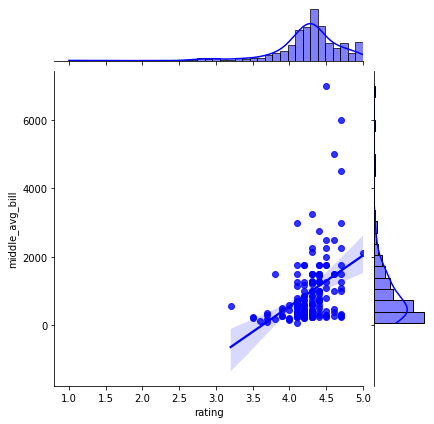

In [44]:
sns.jointplot(x='rating', y='middle_avg_bill', data=one_place_data, kind='reg', color='blue');

На выходе получаем линейную зависимость: чем выше рейтинг, тем больше денег люди тратят в заведениях

### Значения средних чеков по заведениям

In [45]:
middle_data = data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median')
middle_data = middle_data.sort_values(by='middle_avg_bill', ascending=False).reset_index()
middle_data

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Теперь построим хороплет, который будет отражать значения средних чеков по административным районам Москвы 

In [46]:
# Загружаем JSON-файл с границами округов Москвы

state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=middle_data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# Выводим карту

m

Самый высокий средний чек можно получить в Центральном и Западном административных округах ( там он составляет **1000 ₽** ). Самое низкий средний чек в Юго-Восточном АО ( **450 ₽** ). Чем дальше от центра, тем цены ниже во все стороны, кроме Западного и Юго-Западного направлений.

**Промежуточные выводы**:

Проведя исследовательский анализ по входным данным, мы можем сказать, что:

- Всего в датасете представлено 8 категорий заведений ( кафе, ресторан, кофейня, пиццерия, 'бар,паб', быстрое питание, булочная, столовая );
- Самой большой популярностью в Москве пользуются кафе, рестораны и кофейни;
- Больше всего посадочных мест в ресторанах, кафе и кофейнях, меньше - в столовых и булочных;
- **61.9%** заведений не являются сетевыми, **38.1%** относятся к сетям;
- Самые популярные сетевые заведения Москвы - "Шоколадница", "Домино'с пицца" и "Додо пицца";
- Всего в датасете представлено 9 административных районов Москвы. Самое большое количество различных заведений находится в Центральном административном округе. Основные категории заведений в ЦАО: рестораны, кафе, кофейни и бары. Распределение заведений по остальным АО примерно одинаковое;
- Самые высокие рейтинги у баров и пабов;
- Улицы-лилеры по количеству заведений: проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект;
- Самый высокий средний чек можно получить в Центральном и Западном административных округах ( там он составляет **1000 ₽** ). Самое низкий средний чек в Юго-Восточном АО ( **450 ₽** ).

## Детализируем исследование: открытие кофейни

Попробуем ответить на вопрос, осуществима ли мечта заказчика - открыть классную кофейню в Москве. Будем считать, что конкуренции заказчик не боится. 

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [47]:
# Введем отдельную переменную с кофейнями

coffee = data[data['category'] == 'кофейня']

In [48]:
# Посчитаем, сколько всего кофеен в Москве

coffee.shape[0]

1413

In [49]:
# Создаем сводную таблицу для дальнейшего построения графика

coffee_pivot = coffee.pivot_table(index='district', values='address', aggfunc='count').reset_index()
coffee_pivot.rename(columns = {'address':'count'}, inplace = True )
coffee_pivot = coffee_pivot.sort_values(by='count', ascending=False)

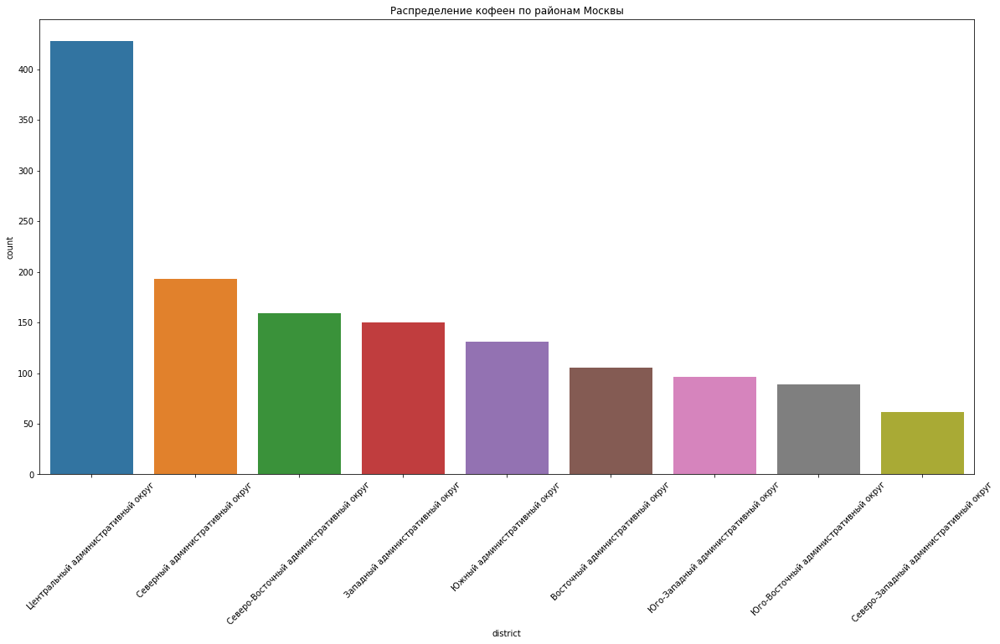

In [50]:
plt.figure(figsize=(20, 10))

ax = sns.barplot(x='district', y='count', data=coffee_pivot) 

plt.xticks(rotation=45)
plt.title('Распределение кофеен по районам Москвы')
plt.show()

Наибольшее скопление кофеен находится в Центральном административном округе ( **428** заведений ). Меньше всего возможностей попить кофе у гостей Северо-Западного АО ( **62** заведения ).

Построим хороплет, чтобы нагляднее представлять распределение кофеен по территории Москвы

In [51]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаём пустой кластер, добавляем его на карту

marker_cluster = MarkerCluster().add_to(m)

# Пишем функцию, которая принимает строку датафрейма,
# Создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# Применяем функцию create_clusters() к каждой строке датафрейма

coffee.apply(create_clusters, axis=1)

# Выводим карту

m

Мы видим, что основная часть кофеен сосредоточена в центре Москвы. Если бы нашего заказчика волновала конкуренция, можно было бы предложить ему рассмотреть Южное, Юго-Восточное и Восточное направления, т.к. в тех округах расположено наименьшее количество заведений и конкуренция будет невысокой, относительно центра города.

### Есть ли круглосуточные кофейни?

In [52]:
# Считаем сколько круглосуточных кофеен есть в датасете

coffee['is_24/7'].sum()

59

In [53]:
# Посмотрим на распределение круглосуточных кофеен по районом города

coffee_24 = coffee.pivot_table(index='district', values='is_24/7', aggfunc='sum').reset_index()
coffee_24.rename(columns = {'is_24/7':'count'}, inplace = True )

In [54]:
coffee_24.sort_values(by='count', ascending=False)

,district,count
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [55]:
# Посчитаем долю круглосуточных заведений от общего числа

coffee_24_persent = ((coffee_24['count'].sum() / coffee.shape[0]) * 100).round(2)
coffee_24_persent

4.18

- Основная часть кофеен, работающих круглосуточно, находится в ЦАО ( **26** заведений );
- Меньше всего продают кофе 24/7 в Юго-Восточном и Южном АО ( по одному заведению на округ );
- Доля круглосуточных кофеен от общего числа получилась небольшая - чуть больше **4%**.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [56]:
# Создаем сводную таблицу средних рейтингов кофеен в разрезе районов

coffee_rating = coffee.pivot_table(index='district', values='rating', aggfunc='mean').\
                                  reset_index().\
                                  sort_values(by='rating', ascending=False).round(2)

In [57]:
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Создадим хороплет для более точного представления о распределении кофеен по районам в зависимости от средних значений рейтинга.

In [58]:
# Загружаем JSON-файл с границами округов Москвы

state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# Выводим карту

m

Кофейни в Москве, в целом, имеют довольно высокие показатели рейтинга. Самый высокий рейтинг в ЦАО и СЗАО. 

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Посмотрим на среднюю и медианную стоимость чашки капучино в зависимости от района Москвы

In [59]:
# Считаем среднюю цену чашки кофе по каждому району

one_cup_price_mean = coffee.pivot_table(index='district', values='middle_coffee_cup', aggfunc='mean').reset_index().round(2)
one_cup_price_mean.rename(columns = {'middle_coffee_cup':'mean_price'}, inplace = True )
one_cup_price_mean = one_cup_price_mean.sort_values(by='mean_price', ascending=False)

,district,mean_price
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


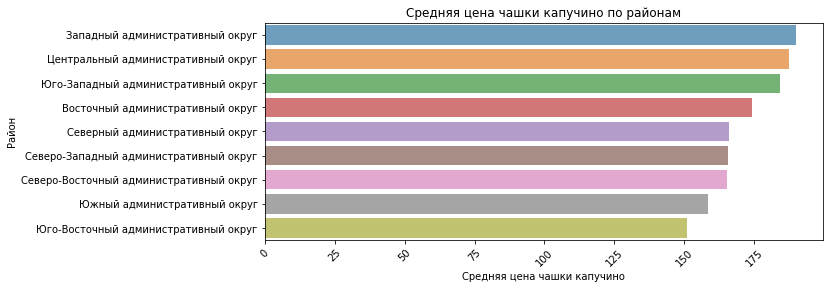

In [60]:
# Смотрим на значения и строим график

display(one_cup_price_mean.sort_values(by='mean_price', ascending=False))

plt.figure(figsize=(10, 4))

ax = sns.barplot(x='mean_price', y='district', data=one_cup_price_mean, alpha=0.7)

ax.set_title('Средняя цена чашки капучино по районам')
ax.set_xlabel('Средняя цена чашки капучино') 
ax.set_ylabel('Район')
plt.xticks(rotation=45)
plt.show()

Средняя цена чашки капучино варьируется в диапазоне от **151** до **190** рублей в зависимости от района Москвы.

In [61]:
# Считаем медианную цену чашки кофе по каждому району

one_cup_price_med = coffee.pivot_table(index='district', values='middle_coffee_cup', aggfunc='median').reset_index().round(2)
one_cup_price_med.rename(columns = {'middle_coffee_cup':'median_price'}, inplace = True )
one_cup_price_med = one_cup_price_med.sort_values(by='median_price', ascending=False)

,district,median_price
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


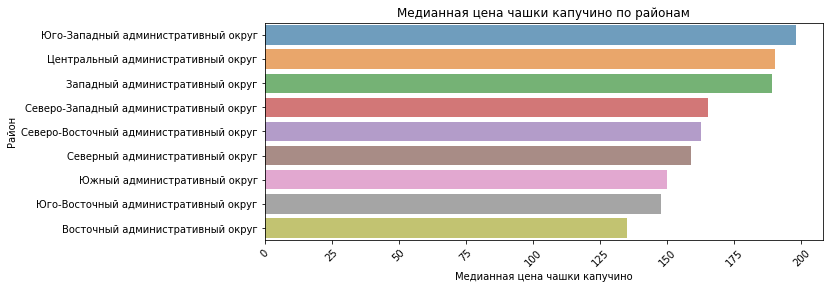

In [62]:
# Смотрим на значения и строим график

display(one_cup_price_med.sort_values(by='median_price', ascending=False))

plt.figure(figsize=(10, 4))

ax = sns.barplot(x='median_price', y='district', data=one_cup_price_med, alpha=0.7)

ax.set_title('Медианная цена чашки капучино по районам')
ax.set_xlabel('Медианная цена чашки капучино') 
ax.set_ylabel('Район')
plt.xticks(rotation=45)
plt.show()

Медианная цена чашки капучино располагается в диапазоне от **135** до **198** рублей. 

In [63]:
# Посмотрим на описательные характеристики, чтобы дополнить наш вывод

coffee['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Немного смущает, что максимальная цена за чашку капучино составляет **1568₽**. Нужно проверить столбец со средними ценами на аномальные выбросы.

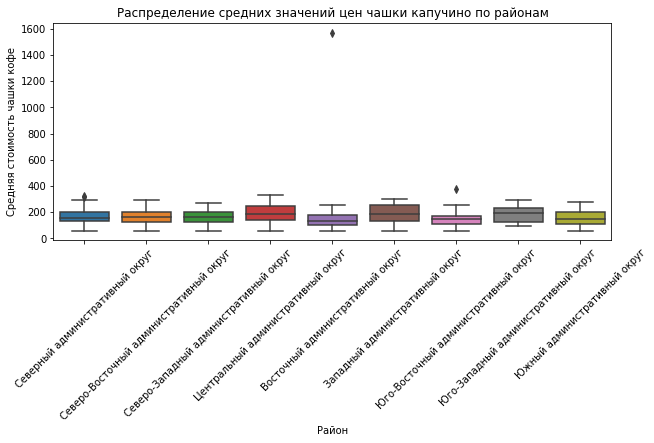

In [64]:
plt.figure(figsize=(10, 4))

ax = sns.boxplot(x='district', y='middle_coffee_cup', data=coffee) 

ax.set_title('Распределение средних значений цен чашки капучино по районам')
ax.set_xlabel('Район') 
ax.set_ylabel('Средняя стоимость чашки кофе')
plt.xticks(rotation=45);

На графике выше можно наблюдать сильный выброс как раз около отметки 1600. Вот и причина такой высокой максимальной цены, это значение смело можно убирать из исследования.

**Выводы и рекомендации**:

По просьбе нашего заказчика, мы провели обособленное исследования кофеен Москвы и готовы предоставить некоторые выводы и рекомендации для открытия нового заведения:

- Наибольшее скопление кофеен находится в Центральном административном округе ( **428** заведений ). Меньше всего возможностей попить кофе у гостей Северо-Западного АО ( **62** заведения );
- Если заказчик будет брать во внимание момент конкуренции, то можно предложить ему рассмотреть Южное, Юго-Восточное и Восточное направления, т.к. в тех округах расположено наименьшее количество заведений и конкуренция будет невысокой, относительно центра города;
- Минимальная стоимость чашки капучино в Москве **60** рублей, максимальная около **350** рублей. Выбор средней/медианной цены за одну чашку кофе зависит от района, в котором будет открываться заведение, но можно сказать, что рекомендуемая цена должна быть около **175** рублей;
- Круглосуточной кофейню делать не стоит, т.к. они особо не пользуются популярностью ( доля круглосуточных кофеен составляет **4%** ). Жители Москвы, ведущие ночной образ жизни, наверняка знают, что большая часть кофеен находится в центре, и, возможно, не заинтересуются новой.

Презентация: <https://disk.yandex.ru/d/07xGoyZorBN8Hg>